#Get data from Kaggle

# **MODEL**

In [1]:
from copy import deepcopy
from dataclasses import dataclass
import multiprocessing as mp
from re import T
import torchvision.models as models
import torch
import copy
import torch.nn.functional as F
#from model import net
import random
import multiprocessing as mp
import os
import os
import torch
import torch.distributed as dist
import torch.multiprocessing as mp
from torchvision import datasets,transforms
import random
from torch import optim,ceil
import torchvision.models as models
import torch.nn.functional as F
from torch import nn
import pickle
import numpy as np
import torchvision.models as models
import os
import pandas as pd
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
from torchvision import transforms
import torch
from sklearn.model_selection import train_test_split
import numpy as np

In [2]:
import pandas as pd
pd.read_csv('../Data/data1k.csv').head(10)

,Unnamed: 0,image,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab,labels
0,4871,a5d29ea15c2be463.jpg,0,0,0,0,0,1,5
1,4095,a161c1cdcbd684bb.jpg,1,0,0,0,0,0,0
2,13857,e0e58d0d5652739b.jpg,0,1,0,0,0,0,1
3,15451,ece5cd0b1cf09269.jpg,0,0,1,0,0,0,2
4,12614,d7e9f82e8c0611cd.jpg,0,0,0,1,0,0,3
5,17366,f8f5ca9394cd3940.jpg,0,0,0,0,0,1,5
6,6211,ad7fa47afcb20402.jpg,0,1,0,0,0,0,1
7,10063,c5a21f933632f2f0.jpg,0,0,0,0,0,1,5
8,3496,9cb09eb2cabfc700.jpg,0,0,1,0,0,0,2
9,12913,da45e0fa5bccbd00.jpg,0,0,0,0,1,0,4


In [ ]:
class HistoryStorage():
  

In [2]:

from torch.utils.data import Dataset,DataLoader


class plantdisease(Dataset):
    def __init__(self, train_df='data/raw/train.csv',test_df='data/raw/test.csv'
                 , img_dir='data/oneFolder'
                 , isTest=False,rank=0,central=False,data=None,num_client=20):
        """
        self.isTest (boolean) :test or not
        self.rank
        self.img_labels (csv) : data to generate -> 
        self.shardsList(list(csv)) : list of parts was splitted from train
        self.data (csv) : data server assign to each clients when generate (using self.makeClientDataSet() function to return data for clients )
            path: Server -> create plantdisease(isTest=True,central=True,num_client) -> plantdisease split train - test (use for server evaluation) -> {train} part continue splitted by the number of clients
            -> self.makeClientDataSet(rank) return part of rank^th shardsList
                  Client -> create local plantdiseas(central=False,data= return of server.dataset.makeClientDataSet(rank)) -> trainning
        """
        #Read dataset (balanced.csv is remake dataset that equalized all len(class))
        self.img_labels=pd.read_csv('../Data/data1k.csv')
        self.img_dir='../Data/train_images/'
        #Sort dataset by columns '1' (columns of labels)
        
        #self.img_labels=self.img_labels.drop([i for i in range(2101,5000)],axis=0)

        #If central -> split train - test data
        if central:
            self.train, self.test = train_test_split(self.img_labels, test_size=0.05)
            self.train.reset_index(inplace=True)
            self.test.reset_index(inplace=True)
            if isTest:
                self.img_labels=self.test
                #self.data_csv=self.data_csv.sort_values('labels')
                self.data_csv=self.data_csv
            else:
                self.img_labels=self.train
            #self.img_labels=self.img_labels.sort_values('labels')
            self.img_labels=self.img_labels
        #Split dataset by the number of num_client (so every client would have their own dataset) -> at most a client can contain 2 class of data
            self.shardsList=np.array_split(self.img_labels,num_client)
        else:
            self.data_csv=data
            self.data_csv.reset_index(inplace=True)
        #rank of client
        self.rank=rank
        self.isTest=isTest

        #Check if data exist -> also mean this is client
        if isinstance(data, pd.DataFrame):
            #Assign data to dataset
            self.img_labels=data



        #if rank:
        #    self.img_labels,old_csv=self.make_newCSV()

        #Muon train cung class cho train va test
        #self.train, self.test = train_test_split(self.img_labels, test_size=0.2)
        #self.train, self.test = train_test_split(self.img_labels, test_size=0.05)

            
        #self.test=self.test.append(old_csv)
    def makeClientDataSet(self,rank):
        newCSV=self.shardsList[rank]
        return newCSV

 #   def makeClientDataSet(self,rank):
 #       import random
 #       a=random.randint(0, 5)
 #       b=random.randint(5, 14)
 #       c=random.randint(5, 14)
 #       classList=[rank]
 #       old_csv=self.train
 #       newCSV=old_csv[(old_csv.iloc[:,2].isin(classList) ) ]

        
 #       return newCSV

 #Use to change state of dataset
    def changeisTest(self,boole):
        self.isTest=boole
        #Update img_labels
        if self.isTest:
            self.img_labels=self.test
        else:
            self.img_labels=self.train
    def __len__(self):
        return len(self.img_labels)
    #def make_newCSV(self):
    #    old_csv=self.img_labels
    #    newCSV=old_csv[old_csv.iloc[:,2]==(self.rank)]

        return newCSV,old_csv
    def __getitem__(self, idx):
            img_path = os.path.join(self.img_dir, self.img_labels['image'][idx])

            image = (read_image(img_path).float())
            self.transform=transforms.Compose([
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),transforms.Resize([ 200, 300])])
            image = self.transform(image)
            label = self.img_labels['labels'][idx]

            return image, label

In [3]:
def plotLabelDistribution(x,y,name):
  #X : 
  import plotly.express as px
  fig = px.bar(y=y,x=x,color=x,title='Dataset of '+ name,text_auto=True,labels={'x':'Disease','y':'Counts'})
  fig.show()


In [10]:
plotLabelDistribution(x=data.sample(800).labels.value_counts().keys(),y=data.sample(800).labels.value_counts().values,name='Tes')

NameError: name 'data' is not defined

In [ ]:
a.list_Client[0].dataset.data_csv.labels.value_counts()

0    12
Name: labels, dtype: int64

In [4]:
class Client():
    def __init__(self,id=9999,dataClass=0,initModel=models.mobilenet_v2(pretrained=True),dataset=None,parameters=None):
        self.id=id
        self.dataClass=dataClass
        self.curModel=initModel
        #For test
        #self.curModel.classifier[1]=(torch.nn.Linear(in_features=1280, out_features=15, bias=True))
        #Parameters:
        self.dataset=plantdisease(isTest=False,data=dataset)
        #self.dataset=dataGeneMNIST.MNIST(isTest=False,data=dataset)
        self.learning_rate=parameters['learning_rate']
        self.momentum=parameters['momentum']
        self.batch_size=parameters['batch_size']
        self.local_epoch=parameters['local_epoch']
        self.weight_decay=parameters['weight_decay']
        self.lossHist=[]
    def __len__(self):
        return len(self.dataset)
    def set_learningrate(self,learning_rate):
        self.learning_rate=learning_rate
    def clientID(self):
        print("ID of client: {}".format(self.id))
    def processID(self):
        print("ID of process: {}".format(os.getpid()))



    def client_train(self,lr=0.0003,epoch=10,optimizer=None):
        print("Client , data: {} trainning".format(self.id))
        
        model = self.curModel
        self.optimizer =optim.SGD(model.classifier.parameters(),lr=self.learning_rate,momentum=self.momentum)
        ####

        dataLoader=torch.utils.data.DataLoader(self.dataset,
                                         batch_size=int(self.batch_size),
                                         shuffle=True)

        ######
        for epoc in range(epoch):
            epoc_loss = 0.0
            for data, target in dataLoader:
            #
                #data = data.repeat(1, 3, 1, 1)
            #
                self.optimizer.zero_grad()
                output = model(data)
                loss = torch.nn.CrossEntropyLoss()(output, target)
                epoc_loss += loss.item()
                loss.backward()
                self.optimizer.step()
            
            print('Client ID ', self.id, ', epoch ',
              epoc, ': ', epoc_loss / self.batch_size)
        torch.cuda.empty_cache()
    def client_trainGPU(self,epoch=0):
        lr=self.learning_rate
        
        print("Client {}, data: {} trainning".format(self.id,self.id))
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.curModel.to(device)
        #self.dataset.changeisTest(False)
        ####
        self.optimizer =optim.Adam(self.curModel.parameters(),lr=self.learning_rate,weight_decay=self.weight_decay)
        dataLoader=torch.utils.data.DataLoader(self.dataset,
                                         batch_size=int(self.batch_size),
                                         shuffle=True)

        ######
        for epoc in range(epoch):
            epoc_loss = 0.0
            for data, target in dataLoader:
            #
            #data = data.repeat(1, 3, 1, 1)
            #   
                
                data,target=data.to(device),target.to(device)
                
                
                output = self.curModel(data)
                loss = torch.nn.CrossEntropyLoss()(output, target)

                epoc_loss += loss.item()
                self.optimizer.zero_grad(set_to_none=True)
                loss.backward()
                self.optimizer.step()
            
            print('Client ID ', self.id, ', epoch ',
              epoc, ': ', epoc_loss / self.batch_size)
            self.lossHist.append(epoc_loss)
        self.curModel.to('cpu')
        
    #Hỏng
    def client_evaluate(self):
        self.curModel.eval()
        testDataset=self.dataset
        testDataset.changeisTest(True)
        testDataLoader=torch.utils.data.DataLoader(testDataset,
                                         batch_size=int(20),
                                         shuffle=True)
        test_loss,correct=0,0
        #device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.curModel.to(0)
        with torch.no_grad():
            for data,labels in testDataLoader:
                data,labels=data.to(0),labels.to(0)
                outputs=self.curModel(data)
                test_loss+=torch.nn.CrossEntropyLoss()(outputs, labels).item()
                predicted=outputs.argmax(dim=1,keepdim=True)
                print(labels)
                print('-----')
                correct += predicted.eq(labels.view_as(predicted)).sum().item()
                print(predicted)
        test_loss = test_loss / len(testDataLoader)
        test_accuracy=correct/len(testDataset)
        message = f"\t[Client {(self.id)}] ...finished evaluation!\
            \n\t=> Test loss: {test_loss:.4f}\
            \n\t=> Test accuracy: {100. * test_accuracy:.2f}%\n"
        print(message, flush=True)
#a=Client(dataClass=1)
#a.client_trainGPU(epoch=30)
#def saveServer(server):
#    import pickle
#    with open('server.pickle', 'wb') as f:
#        pickle.dump(server, f)
#saveServer(a)
#a.client_evaluate()

class server():
    def __init__(self,tensorboard,parameters):
        self.list_Client=[]
        self.centralModel=models.mobilenet_v2(pretrained=True)
        
        self.centralModel.classifier[1]=(torch.nn.Linear(in_features=1280, out_features=6, bias=True))
        self.centralDataset=plantdisease(isTest=False,rank=None,central=True,num_client=parameters['server']['num_clients'])
        self.parameters=parameters
        self.num_clients=parameters['server']['num_clients']
        self.num_round=parameters['server']['num_round']
        self.num_client_perRound=parameters['server']['num_client_perRound']
        self.isParallel=parameters['server']['isParallel']
        self.local_epoch=parameters['server']['local_epoch']
        self.accuracyHist=[]
        self.lossHist=[]
    def __len__(self):
        return len(self.list_Client)

    def changeLR(self,lr):
        for client in self.list_Client:
            client.set_learningrate(lr)
    def generateClient(self):
        #print('List class {} '.format(dices_classs))
        for i in range(0,self.num_clients):

            #makeClientDataSet(rank) -- with rank is the id of shards data
            datasetTemp=self.centralDataset.makeClientDataSet(rank=i)
            #Assign each client a shard of dataset 
            self.list_Client.append(Client(id=i,dataset=datasetTemp,initModel=copy.deepcopy(self.centralModel),parameters=self.parameters['client']))
        #for i in dices_classs:
        #    if(i>14):
        #        datasetTemp=self.centralDataset.makeClientDataSet(rank=random.randint(0, 10))
        #    else:
        #        datasetTemp=self.centralDataset.makeClientDataSet(rank=i)
        #    self.list_Client.append(client.Client(id=i,dataset=datasetTemp,initModel=copy.deepcopy(self.centralModel),parameters=self.parameters['client']))

    def updateClientModel(self):
        params=self.collectModel()
        paraAverage=self.averageModel(params)
        self.centralModel.load_state_dict(paraAverage)
        
        for idx in self.list_Client:
            #Sửa thử xem load_state_dict lcu1 trước làm việc có đúng ko
            #client.curModel.load_state_dict(paraAverage)
            idx.curModel=copy.deepcopy(self.centralModel)
        print('All clients updated')
    def collectModel(self):
        model_params=[]
        for client in self.Dices:
            model_params.append(client.curModel.state_dict())
        return model_params
    def averageModel(self,params):
        total_len=0
        for i in self.Dices:
            total_len+=len(i)
        listClient_thisRound=self.Dices
        
        #coef=1/len(listClient_thisRound)
        global_model_weights = copy.deepcopy(self.centralModel.state_dict())
        for key in global_model_weights:
            global_model_weights[key] = torch.zeros_like(
                global_model_weights[key])
        
        #server_params=copy.deepcopy(self.centralModel.parameters())

        coef=torch.tensor([len(listClient_thisRound[i])/total_len for i in range(0,len(listClient_thisRound)-1)])
        print(coef)
        for i in range(0,len(listClient_thisRound)-1):
            local_model_weights = copy.deepcopy(listClient_thisRound[i].curModel.state_dict())
            for key in global_model_weights:
                if str(global_model_weights[key].type())!='torch.LongTensor':
                    print(i)
                    global_model_weights[key] += (coef[i] * local_model_weights[key])
        return global_model_weights
        print('finish average')
        #coef=1
        # from collections import OrderedDict
        # paraOut=OrderedDict()
        # for key in params[0]:
        #     if key=='classifier.1.weight' or key=='classifier.1.bias'  :
        #         paraOut[key] = sum([params[i][key]*coef[i] for i in range(0,len(params)-1)])
        #     else:
        #         paraOut[key]=params[0][key]
            #paraOut[key] = sum([params[i][key]*coef[i] for i in range(0,len(params)-1)])
        #return paraOut
        #for i in range(0,len(params)-1):
        #    for key in params[0]:
        #        if i==0:
         #           paraOut[key]=params[i][key]*coef[i]
         #       else:
         #           paraOut[key]+=params[i][key]*coef[i]
    def evaluate_CentralModel(self):
        model=self.centralModel
        model.eval()
        self.centralDataset.changeisTest(True)
        testDataLoader=torch.utils.data.DataLoader(self.centralDataset,
                                         batch_size=int(20),
                                         shuffle=True)
        test_loss,correct=0,0

        with torch.no_grad():
            for data,labels in testDataLoader:
                outputs=self.centralModel(data)


                test_loss+=torch.nn.CrossEntropyLoss()(outputs, labels).item()
                predicted=outputs.argmax(dim=1,keepdim=True)
                print('Labels')
                print(predicted)
                print('------------------------')
                correct += predicted.eq(labels.view_as(predicted)).sum().item()
        test_loss = test_loss / len(testDataLoader)
        test_accuracy=correct/len(self.centralDataset)
        self.accuracyHist.append(test_accuracy)

        self.lossHist.append(test_loss)
        print(self.lossHist)
        print(self.accuracyHist)
        message = f"\t[Central Model ] ...finished evaluation!\
            \n\t=> Test loss: {test_loss:.4f}\
            \n\t=> Test accuracy: {100. * test_accuracy:.2f}%\n"
        print(message, flush=True)
        self.centralDataset.changeisTest(False)

        print('next round')
    def trainClientsQueue(self):
        print("There are {} client in environment".format(len(self.list_Client)))
        from random import sample
        self.Dices=sample(self.list_Client,self.num_client_perRound)
        print("This epoch have clients with id {}".format(self.Dices))
        for client in self.Dices:
            #plotLabelDistribution(x=client.dataset.data_csv.labels.value_counts().keys(),y=client.dataset.data_csv.labels.value_counts(),name='Client '+str(client.id))

            client.client_trainGPU(epoch=self.local_epoch)

        print("Finish train per client")
        self.updateClientModel()
        self.evaluate_CentralModel()
        #print([self.list_Client[idx].id for idx in self.Dices])
    def roundTrain(self):
        self.trainClientsQueue()

In [9]:
i=1
name='/content/drive/MyDrive/Prethesis-model/server{}.pickle'.format(i)
name

'/content/drive/MyDrive/Prethesis-model/server1.pickle'

In [ ]:
from google.colab import files
uploaded = files.upload()

# **RUN**

FROM BEGINNING

Case {'dataset': 'plantdisease',
 'client': {'learning_rate': 5e-05,
  'momentum': 0.0,
  'weight_decay': 9e-05,
  'batch_size': 30,
  'local_epoch': 1},
 'server': {'num_clients': 100,
  'num_class': 6,
  'num_round': 100,
  'num_client_perRound': 25,
  'isParallel': 'False',
  'model': 'mobilenetv3',
  'local_epoch': 10}}

In [6]:
info={'dataset': 'plantdisease',
 'client': {'learning_rate': 5e-05,
  'momentum': 0.0,
  'weight_decay': 9e-05,
  'batch_size': 30,
  'local_epoch': 1},
 'server': {'num_clients': 100,
  'num_class': 6,
  'num_round': 100,
  'num_client_perRound': 50,
  'isParallel': 'False',
  'model': 'mobilenetv3',
  'local_epoch': 10}}
from importlib.abc import Loader
import yaml
from yaml.loader import SafeLoader


if __name__ == '__main__':
    def saveServer(server):
        import pickle
        with open('./model.pickle', 'wb') as f:
            pickle.dump(server, f)

    a=server(tensorboard=0,parameters=info)
    a.generateClient()
    for i in range(0,info['server']['num_round']):
      print("Round {}".format(i))
      a.roundTrain()
      if(i%5==0):
        print('Server saved {}'.format(i))
        saveServer(a)
    #writer.flush()

Round 0
There are 100 client in environment
This epoch have clients with id [<__main__.Client object at 0x0000022486AB8A60>, <__main__.Client object at 0x00000224C2FC3970>, <__main__.Client object at 0x00000222F07201C0>, <__main__.Client object at 0x00000224C3043CD0>, <__main__.Client object at 0x00000224C3006D00>, <__main__.Client object at 0x00000222DD24AD90>, <__main__.Client object at 0x0000022335B73FD0>, <__main__.Client object at 0x000002232AC8AB80>, <__main__.Client object at 0x00000224E115A730>, <__main__.Client object at 0x00000224B0C647C0>, <__main__.Client object at 0x00000222A94EC1C0>, <__main__.Client object at 0x00000224940D3E50>, <__main__.Client object at 0x00000224F1335B50>, <__main__.Client object at 0x00000222F0737D60>, <__main__.Client object at 0x00000224EE8C1BE0>, <__main__.Client object at 0x00000224F0F87BE0>, <__main__.Client object at 0x00000224E825DB50>, <__main__.Client object at 0x000002249A0A0EE0>, <__main__.Client object at 0x00000224F4721B50>, <__main__.C

KeyboardInterrupt: 

In [ ]:
!cp -b /content/drive/MyDrive/Prethesis-model/server1.pickle /content/drive/MyDrive/Prethesis-model/server1backup.pickle


In [15]:
import pickle
info={'dataset': 'plantdisease',
 'client': {'learning_rate': 5e-05,
  'momentum': 0.0,
  'weight_decay': 9e-05,
  'batch_size': 30,
  'local_epoch': 1},
 'server': {'num_clients': 14,
  'num_class': 6,
  'num_round': 100,
  'num_client_perRound': 15,
  'isParallel': 'False',
  'model': 'mobilenetv3',
  'local_epoch': 10}}
from importlib.abc import Loader
import yaml
from yaml.loader import SafeLoader
conti=[]

def saveServer(server):
  import pickle
  with open('./model.pickle', 'wb') as f:
    pickle.dump(server, f)
if __name__ == '__main__':

  with open('./Finished model/model.pickle', 'rb') as f:
    conti=pickle.load(f)
    #from torch.utils.tensorboard import SummaryWriter
    #writer = SummaryWriter()
    f.close()

In [16]:
conti.list_Client[0].dataset.img_labels

,level_0,index,Unnamed: 0,image,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab,labels
0,0,3139,6219,ad859555ca6dc8a5.jpg,0,0,0,0,0,1,5
1,1,4633,13842,e0d517cfe7a89058.jpg,0,1,0,0,0,0,1
2,2,1884,9913,c4bacf90a979344b.jpg,0,0,1,0,0,0,2
3,3,3004,16807,f58f42171bb497c0.jpg,0,0,0,0,1,0,4
4,4,2916,14040,e1b9cdf8344194d5.jpg,0,0,1,0,0,0,2
5,5,2263,264,81b09bc35d29cb67.jpg,0,1,0,0,0,1,1
6,6,294,1587,8c7f8f418e62d06b.jpg,0,0,0,0,0,1,5
7,7,414,14739,e8406b819f5b6f86.jpg,0,0,0,1,0,0,3
8,8,914,11711,d1a0a392cadb196f.jpg,0,0,0,1,0,0,3
9,9,4247,14835,e8b3a4c8438d2f75.jpg,0,0,0,0,0,1,5


In [7]:
import matplotlib.pyplot as plt

In [5]:
len(conti.accuracyHist)

41

In [10]:
conti.list_Client[0].dataset.img_labels

,level_0,index,Unnamed: 0,image,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab,labels
0,0,1524,10269,c6e3f29803fc462d.jpg,0,0,0,1,0,0,3
1,1,4160,8735,be68c8958579ab29.jpg,0,0,1,0,0,0,2
2,2,2145,17172,f837fd305881472e.jpg,0,0,1,0,0,0,2
3,3,4246,3929,a0929ed71f1b843e.jpg,0,0,0,0,0,1,5
4,4,3150,4596,a4f2950a78bc3a76.jpg,0,0,0,1,0,0,3
5,5,3908,5256,a8c2e867c0ebd48f.jpg,0,0,1,0,0,0,2
6,6,5805,17694,fb2d81cd1d5a4c38.jpg,0,0,1,0,0,0,2
7,7,5261,4057,a0f9a52c45ec656b.jpg,0,0,1,0,0,0,2
8,8,2834,17907,fc9ec158cf4e84c2.jpg,0,1,0,0,0,0,1
9,9,3283,12366,d5e89b7c031b9652.jpg,0,0,1,0,0,0,2


conti.list_Client[0].dataset

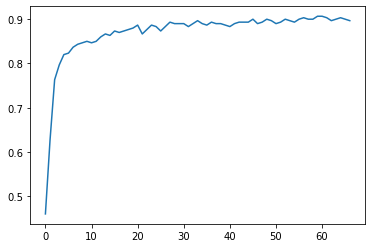

In [10]:
import matplotlib.pyplot as plt
plt.plot(conti.accuracyHist)

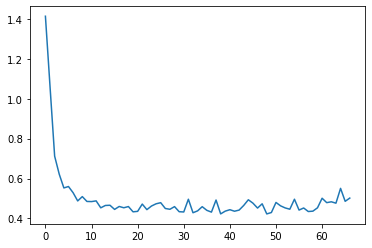

In [11]:
plt.plot(conti.lossHist)

In [13]:
max(conti.accuracyHist)

0.8966666666666666

In [17]:
min(conti.lossHist)

0.4228292261560758

In [11]:
for i in range(0,info['server']['num_round']):
    print("Round {}".format(i))
    conti.roundTrain()
    if(i%2==0):
        print('Server saved {}'.format(i))
        saveServer(conti)

Round 0
There are 100 client in environment
This epoch have clients with id [<__main__.Client object at 0x000001EE61C347C0>, <__main__.Client object at 0x000001EE42837AC0>, <__main__.Client object at 0x000001EF006F0AC0>, <__main__.Client object at 0x000001EF658C5220>, <__main__.Client object at 0x000001EF657E5FD0>, <__main__.Client object at 0x000001EEB3E127F0>, <__main__.Client object at 0x000001EE09605970>, <__main__.Client object at 0x000001EF199D4D90>, <__main__.Client object at 0x000001EEB3EBCA90>, <__main__.Client object at 0x000001EFE76B0AC0>, <__main__.Client object at 0x000001EF8D074AC0>, <__main__.Client object at 0x000001EE9F448F40>, <__main__.Client object at 0x000001EFBE106D30>, <__main__.Client object at 0x000001EE1CC164F0>, <__main__.Client object at 0x000001EFB3838910>]
Client 11, data: 11 trainning


In [10]:
(conti.accuracyHist)

[0.46,
 0.6266666666666667,
 0.7633333333333333,
 0.7966666666666666,
 0.82,
 0.8233333333333334,
 0.8366666666666667,
 0.8433333333333334,
 0.8466666666666667,
 0.85,
 0.8466666666666667,
 0.85,
 0.86,
 0.8666666666666667,
 0.8633333333333333,
 0.8733333333333333,
 0.87,
 0.8733333333333333,
 0.8766666666666667,
 0.88,
 0.8866666666666667,
 0.8666666666666667,
 0.8766666666666667,
 0.8866666666666667,
 0.8833333333333333,
 0.8733333333333333,
 0.8833333333333333,
 0.8933333333333333,
 0.89,
 0.89,
 0.89,
 0.8833333333333333,
 0.89,
 0.8966666666666666,
 0.89,
 0.8866666666666667]

In [ ]:
len(conti.accuracyHist)

43

MobileNetV2(
  (features): Sequential(
    (0): ConvNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): ConvNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): ConvNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=1e-05,

In [ ]:
torch.save(conti.centralModel.state_dict(), 'parameter.pth')

Text(0, 0.5, 'Accuracy')

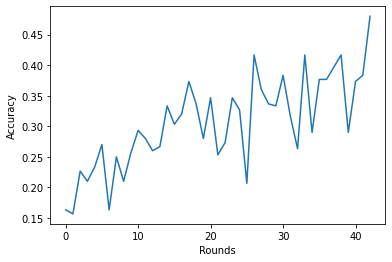

In [ ]:
import matplotlib.pyplot as plt
plt.plot(range(0,len(conti.accuracyHist)),conti.accuracyHist,)
plt.xlabel("Rounds")
plt.ylabel("Accuracy")


Text(0, 0.5, 'Loss History')

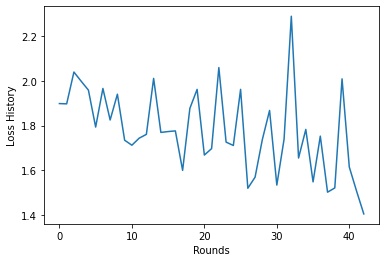

In [ ]:
plt.plot(range(0,len(conti.accuracyHist)),conti.lossHist,)
plt.xlabel("Rounds")
plt.ylabel("Loss History")

In [ ]:
a=[1.8987637519836427, 1.8974739154179892, 2.040224885940552, 1.9990726629892985, 1.959251054128011, 1.7933303674062093, 1.9666422128677368, 1.825169316927592, 1.9407729864120484, 1.7343559583028159, 1.711883536974589, 1.7433618625005087, 1.7605376640955608, 2.011758049329122, 1.7692884127298991, 1.7731905698776245, 1.7760921080907186, 1.5990015029907227, 1.877139433224996, 1.9624298254648844, 1.6677559773127237, 1.69661279519399, 2.0603761355082195, 1.7258090734481812, 1.7107341527938842, 1.962593142191569, 1.518720022837321, 1.5685885270436606, 1.737037189801534, 1.8678918679555256, 1.5330387671788535, 1.738879934946696, 2.290648682912191, 1.6545614878336588, 1.7826974074045816, 1.5473427534103394, 1.752670987447103, 1.5011515061060587, 1.5201624870300292, 2.0096364259719848, 1.6141677856445313, 1.5065311829249064, 1.403585934638977, 1.811416776974996]
len(a)

44

In [ ]:
import joblib 

In [ ]:
joblib.load(open('/content/drive/MyDrive/Prethesis-model/server1 (1).pickle', 'rb'))

KeyError: ignored

Continue Running

In [ ]:
info={'dataset': 'plantdisease',
 'client': {'learning_rate': 1e-05,
  'momentum': 0.0,
  'weight_decay': 1e-05,
  'batch_size': 25
  },
 'server': {'num_clients': 100,
  'num_class': 6,
  'num_round': 100,
  'num_client_perRound': 25,
  'isParallel': 'False',
  'model': 'mobilenetv3',
  'local_epoch': 10}}
best_acc=[999]

from importlib.abc import Loader
import yaml
from yaml.loader import SafeLoader
#Continue 
if __name__ == '__main__':
  def saveServer(server):
    import pickle
    with open('/content/server1.pickle', 'wb') as f:
      pickle.dump(server, f)
      f.close()
    #with open('/content/drive/MyDrive/Prethesis-model/server1.pickle', 'wb') as f:
    #  pickle.dump(server, f)
    #  f.close()
  def saveBestAServer(server,acc):
    import pickle
    with open('/content/drive/MyDrive/Prethesis-model/serverBest.pickle', 'wb') as f:
      pickle.dump(server, f)
      f.close()
    with open('/content/serverBest.pickle', 'wb') as f:
      pickle.dump(server, f)
      f.close()
  def saveBestLServer(server,loss):
    import pickle
    with open('/content/drive/MyDrive/Prethesis-model/serverBestL.pickle', 'wb') as f:
      pickle.dump(server, f)
      print('another best, {} loss'.format(loss))
      f.close()
    with open('/content/serverBestL.pickle', 'wb') as f:
      pickle.dump(server, f)
      f.close()

  import pickle
  with open('/content/drive/MyDrive/Prethesis-model/serverBest.pickle', 'rb') as f:
    conti=pickle.load(f)
    #from torch.utils.tensorboard import SummaryWriter
    #writer = SummaryWriter()
    f.close()
  for i in range(0,info['server']['num_round']):
    print("Round {}".format(len(conti.accuracyHist)))
    conti.roundTrain()
    if conti.accuracyHist[-1]>max(conti.accuracyHist[:-2]):
      saveBestServer(conti,conti.accuracyHist[-1])
    if conti.lossHist[-1]<min(conti.lossHist[:-2]):
      saveBestLServer(conti,conti.lossHist[-1])
    if i%4==0:
      saveServer(conti)
    torch.save(conti.centralModel.state_dict(), '/content/parameter.pt')

KeyboardInterrupt: ignored

Temp

In [ ]:
!cp -b /content/drive/MyDrive/Prethesis-model/server1.pickle /content/drive/MyDrive/Prethesis-model/server1backup.pickle

In [ ]:
import pickle
with open('/content/drive/MyDrive/Prethesis-model/server2.pickle', 'rb') as f:
  contiServer=pickle.load(f)
for i in range(0,info['server']['num_round']):
  print("Round {}".format(i))
  a.roundTrain()
  saveServer(a)

In [ ]:
import os
scores=0
unpickler=0
if os.path.getsize('/content/drive/MyDrive/Prethesis-model/server2.pickle') > 0:      
    with open('/content/drive/MyDrive/Prethesis-model/server2.pickle', "rb") as f:
        unpickler = pickle.Unpickler(f)
        # if file is not empty scores will be equal
        # to the value unpickled
        scores = unpickler.load()
        print(unpickler,scores)

<_pickle.Unpickler object at 0x7f4df5d6b4d0> <__main__.server object at 0x7f4df624e550>


In [ ]:
unpickler

In [ ]:
import pickle
file = open("Fruits.obj",'rb')


In [ ]:
info={'dataset': 'plantdisease',
 'client': {'learning_rate': 7e-06,
  'momentum': 0.0,
  'weight_decay': 1e-05,
  'batch_size': 25,
  'local_epoch': 1},
 'server': {'num_clients': 100,
  'num_class': 6,
  'num_round': 100,
  'num_client_perRound': 25,
  'isParallel': 'False',
  'model': 'mobilenetv3',
  'local_epoch': 10}}
from importlib.abc import Loader
import yaml
from yaml.loader import SafeLoader



if __name__ == '__main__':
    def saveServer(server,i):
        import pickle
        name='/content/drive/MyDrive/Prethesis-model/server{}.pickle'.format(i)
        with open(name, 'wb') as f:
            pickle.dump(server, f)
        print('savedModel')
        
    from torch.utils.tensorboard import SummaryWriter
    #writer = SummaryWriter(
    a=server(tensorboard=0,parameters=info)
    a.generateClient()
    for i in range(0,info['server']['num_round']):
    
      print("Round {}".format(i))
      a.roundTrain()
      if i%4==0:
        saveServer(a,1)
    
    #writer.flush()

KeyboardInterrupt: ignored